# Project Description
This notebook is the creation, training, and evaluation of a Generative Adversarial Network, or GAN, that attempts to convert photographic images into the style of famous painter Claude Monet. The main idea behind a GAN is that a set of two models, working against one another, can train eachother to maximize their own purposes. The generative model attempts to generate an image that is indistinguishable from a real Monet painting image while the discriminative model attempts to accurately discern a fake, generated Monet image from a real Monet painting. As the generator gets better at making a convincing image, the discriminator has better material to train on, and as the discriminator gets stronger, the generator is given higher standards.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
#for dirname, _, filenames in os.walk('/kaggle/input'):
    #for filename in filenames:
        #print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
!pip install tensorflow_addons
import tensorflow_addons as tfa

from kaggle_datasets import KaggleDatasets
import matplotlib.pyplot as plt
import numpy as np

try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE
    
print(tf.__version__)

D0426 07:11:04.634678136      14 config.cc:119]                        gRPC EXPERIMENT tcp_frame_size_tuning               OFF (default:OFF)
D0426 07:11:04.634711023      14 config.cc:119]                        gRPC EXPERIMENT tcp_rcv_lowat                       OFF (default:OFF)
D0426 07:11:04.634714409      14 config.cc:119]                        gRPC EXPERIMENT peer_state_based_framing            OFF (default:OFF)
D0426 07:11:04.634716997      14 config.cc:119]                        gRPC EXPERIMENT flow_control_fixes                  ON  (default:ON)
D0426 07:11:04.634719386      14 config.cc:119]                        gRPC EXPERIMENT memory_pressure_controller          OFF (default:OFF)
D0426 07:11:04.634721814      14 config.cc:119]                        gRPC EXPERIMENT unconstrained_max_quota_buffer_size OFF (default:OFF)
D0426 07:11:04.634724361      14 config.cc:119]                        gRPC EXPERIMENT new_hpack_huffman_decoder           ON  (default:ON)
D0426 07:11:04.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 KB 8.7 MB/s eta 0:00:00a 0:00:01
You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.


/usr/local/lib/python3.8/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


Device: 
INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.
INFO:tensorflow:Initializing the TPU system: local
INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


Number of replicas: 8
2.12.0


## Data Importation
In this project we are given two forms of data that we can pick from for our model, .tfrec files and .jpg files. I chose to use the .tfrec files as I plan on using tensorflow for the remainder of the notebook, which has built in integration for the reading in and developing of .tfrec files. First we read in these files by byte and then we convert them into tensors. They are then converted into float32 tensors, to reduce computation times, and normalized so that the pixel values exist between 0 and 1 rather than 0 and 255, once again to reduce computation times. We then reshape the tensor to 256 rows of pixels, 256 columns of pixels, and 3 channels (RGB) per pixel. 

In [2]:
#Grabbing lists of file names from the .tfrec folders
monet_tfrec_path = "/kaggle/input/gan-getting-started/monet_tfrec"
monet_filenames = []
for f in os.listdir(monet_tfrec_path):
    monet_filenames.append(os.path.join(monet_tfrec_path, f))

photo_tfrec_path = "/kaggle/input/gan-getting-started/photo_tfrec"
photo_filenames = []
for f in os.listdir(photo_tfrec_path):
    photo_filenames.append(os.path.join(photo_tfrec_path, f))
    
monet_filenames, photo_filenames

(['/kaggle/input/gan-getting-started/monet_tfrec/monet12-60.tfrec',
  '/kaggle/input/gan-getting-started/monet_tfrec/monet16-60.tfrec',
  '/kaggle/input/gan-getting-started/monet_tfrec/monet08-60.tfrec',
  '/kaggle/input/gan-getting-started/monet_tfrec/monet04-60.tfrec',
  '/kaggle/input/gan-getting-started/monet_tfrec/monet00-60.tfrec'],
 ['/kaggle/input/gan-getting-started/photo_tfrec/photo12-352.tfrec',
  '/kaggle/input/gan-getting-started/photo_tfrec/photo11-352.tfrec',
  '/kaggle/input/gan-getting-started/photo_tfrec/photo05-352.tfrec',
  '/kaggle/input/gan-getting-started/photo_tfrec/photo08-352.tfrec',
  '/kaggle/input/gan-getting-started/photo_tfrec/photo18-352.tfrec',
  '/kaggle/input/gan-getting-started/photo_tfrec/photo06-352.tfrec',
  '/kaggle/input/gan-getting-started/photo_tfrec/photo17-352.tfrec',
  '/kaggle/input/gan-getting-started/photo_tfrec/photo10-352.tfrec',
  '/kaggle/input/gan-getting-started/photo_tfrec/photo09-352.tfrec',
  '/kaggle/input/gan-getting-started/p

In [3]:
#Function that takes in tf tensor, normalizes it between 0 and 1, converts to float32, reshapes to image size. Reduces computation times later
def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    #print(image)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    #print(image)
    image = tf.reshape(image, [256, 256, 3])
    #print(image)
    return image

#Function that takes in read-in file and converts to tensor, then calls decode_image on that tensor before returning it.
def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

In [4]:
#Takes in the list of file names, reads in dataset of files by byte, maps each file to the above functions
def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    #print(dataset)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return dataset

## Exploratory Data Analysis
We are told the size of the images given so there isn't much EDA to do. Nonetheless we find the counts of Monet painting images to be much lower than that of the photo images. This could lead to a model much more diversely trained on photos than paintings, which is to be expected as there are many more photos than there are Monet paintings. A quick Google search attributes 2,500+ paintings to monet, so a more robust Monet dataset could lead to a model more capable of understanding his particular style and its differences from photographs. We then take a few examples of photos and paintings to help us spot some differences, such as sharper photos and blurrier paintings.

In [5]:
monet_ds = load_dataset(monet_filenames, labeled=True).batch(1)
photo_ds = load_dataset(photo_filenames, labeled=True).batch(1)
print(f'Number of Monet Images: {len(list(monet_ds))}\nNumber Of Photo Images: {len(list(photo_ds))}')

Number of Monet Images: 300
Number Of Photo Images: 7038


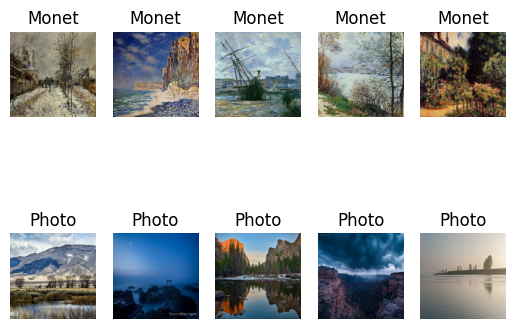

In [6]:
monet_iter = iter(monet_ds)
photo_iter = iter(photo_ds)
example_monets = monet_ds.take(5)
example_photos = photo_ds.take(5)

for i, (m_example, p_example) in enumerate(zip(example_monets, example_photos)):

    plt.subplot(2,5,1+i)
    plt.axis('off')
    plt.title('Monet')
    plt.imshow((m_example[0].numpy()*127.5+127.5).astype(np.uint8))
    plt.subplot(2,5,6+i)
    plt.axis('off')
    plt.title('Photo')
    plt.imshow((p_example[0].numpy()*127.5+127.5).astype(np.uint8))

## Model Architecture
Here we use a GAN, generative adversariel matrix, to both train the creation (generation) of "Monet-like" images and the discerning (discrimination) between a real Monet painting image and a generated one. These models will compete with one another, with the generator attempting to 'trick' the discriminator and generate an image that the discriminator thinks is a Monet, while the discriminator will try to, well, discriminate between the two.

First we define a function downsample and upsample. These will be used repeatedly within our GAN as part of the UNET architecture. Essentially, each downsample() and upsample() call is a applying a convolutional matrix and a LeakyRelu activation function to the matrix fed into it. The idea is that we increase the feature size repeatedly with the downsample and then return it to the original form using upsample, while creating parameters that can be tuned later on so that the image that is created at the end will have, in this case, Monet-like features applied to it through these trained parameters.

In [7]:
def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_instancenorm:
        result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    result.add(layers.LeakyReLU())

    return result

In [8]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result

Here we have our generator model. This function returns a keras Model with our UNET architecture. First we have the downstacking layers, which are concatenated with the upstacking layers. Finally we have one last unconvolution layer with an activation function of tanh. I'm not quite sure why yet but don't use ReLU here, the generator will not learn if you do. Use tanh instead. My guess is that the function just never activates with our initialization if it's ReLU, but tanh will always have some nonzero output.

In [9]:
def Generator():
    inputs = layers.Input(shape=[256, 256, 3])
    
    #all our downsampling layers
    down_stack = [
        downsample(64, 4, apply_instancenorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]
    
    #upsampling layers
    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]
    
    initializer = tf.random_normal_initializer(0, 0.02)
    last = layers.Conv2DTranspose(3, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh')
    
    x = inputs
    
    #Downsampling
    
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    #we use the output from the final downsample layer to create the first upsample layer but we don't retain it itself for concatenation. This is because we need to concatenate to make
    #our skip connections work from first downsample layer to last upsample layer etc. But there's no equivalent size upsample for the final downsample layer to concatenate to, or connect to, as it
    #is the furthest point from the original image
    #we reverse so that they concatenate to the upsampling layers of the same sizes
    skips = reversed(skips[:-1])
    
    #upsampling and skip-connecting
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])


    x = last(x)
    
    return keras.Model(inputs=inputs, outputs=x)

Here's our discriminator. This is the function that attempts to tell the difference between a generated image and an image from our datasets. The big deal here is that we output a 2D matrix with values ranging from 0-1, where higher values reflect confidence that the image is real and not generated. This is contrasted to other models that output a single softmax ouput for classifications. Later when we use a loss function to test this, we'd calculate it based on the totality of values returned. No skip connections here, just a CNN with padding and some activation functions.

In [10]:
def Discriminator():
    initializer = tf.random_normal_initializer(0, 0.02)
    gamma_init = keras.initializers.RandomNormal(0, 0.02)
    
    inp = layers.Input(shape=[256, 256, 3], name='input image')
    
    x = inp
    
    down1 = downsample(64, 4, False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)
    
    zero_pad1 = layers.ZeroPadding2D()(down3)
    
    conv = layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1)
    
    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)
    
    leaky_relu = layers.LeakyReLU()(norm1)
    
    zero_pad2 = layers.ZeroPadding2D()(leaky_relu)
    
    last = layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2)
    
    return tf.keras.Model(inputs=inp, outputs=last)

Here we create two of each model. One generator will be trained to make a convincing photograph from a Monet painting, while the other will do the opposite and take a photographic image and apply Monet's style. Similarly we have a discriminator for each of recognizing real and fake Monet-esque images and recognizing real and fake photographic images.

In [11]:
#Insantiating our generators and discriminators
with strategy.scope():
    monet_generator = Generator()
    photo_generator = Generator()
    
    monet_discriminator = Discriminator()
    photo_discriminator = Discriminator()

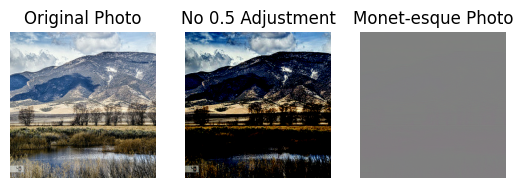

In [12]:
#show a test, but since we haven't trained our generator it's really really bad
#the 0.5s are to center the pixel values between 0 and 1, i think. We do this a lot to return the images to 0-255 range while being centered around 127.5.
#the second image shows what would happen without this adjustment
example_photo = next(iter(example_photos))
to_monet = monet_generator(example_photo)

plt.subplot(131)
plt.title("Original Photo")
plt.axis('off')
plt.imshow(example_photo[0] * 0.5 + 0.5)

plt.subplot(132)
plt.axis('off')
plt.title("No 0.5 Adjustment")
plt.imshow(example_photo[0])

plt.subplot(133)
plt.axis('off')
plt.title("Monet-esque Photo")
plt.imshow(to_monet[0] * 0.5 + 0.5)
plt.show()

This is our GAN itself. This class mostly consists of a bunch of functions representing the models above, be them discriminators or generators, as well as the loss functions that we have yet to define. The train step function is essentially what needs to be done to train and evaluate our GAN for each epoch. We generate the images, train the discriminator on real images, then the fake images, and then calculate our loss functions for this step. Then we calculate the gradients for the loss functions, apply those gradients to the optimizer functions, and return some loss values.

In [13]:
class CycleGan(keras.Model):
    def __init__(self, monet_generator, photo_generator, monet_discriminator,
                photo_discriminator, lambda_cycle=10,):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lcycle = lambda_cycle

    def compile(self, m_gen_opter, p_gen_opter, m_disc_opter, p_disc_opter,
               gen_loss_fn, disc_loss_fn, cyc_loss_fn, id_loss_fn):
        super(CycleGan, self).compile()
        self.m_gen_opter = m_gen_opter
        self.p_gen_opter = p_gen_opter
        self.m_disc_opter = m_disc_opter
        self.p_disc_opter = p_disc_opter
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cyc_loss_fn = cyc_loss_fn
        self.id_loss_fn = id_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
    
        with tf.GradientTape(persistent=True) as tape:
            #Takes the real photo and tries to make a monet out of it
            fake_monet = self.m_gen(real_photo, training=True)
            #takes that attempted monet and tries to turn it back into photo
            cyc_photo = self.p_gen(fake_monet, training=True)
            #if the generator is good, the new and old photo are very close to one another

            #this does the same thing but for monet->photo->monet
            fake_photo = self.p_gen(real_monet, training=True)
            cyc_monet = self.m_gen(fake_photo, training=True)

            #Takes the image and tries to convert it into itself. Not really sure why.
            #I guess the discriminator really really shouldn't be able to tell the difference here
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            #using the discriminator on real images, tests if our discriminator is actually accurate i guess
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            #same thing but with fake images, we wanna trick the discriminator but
            #we also want the discriminator to be strong
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            #evalate generator loss function, takes in the discriminator and evaluates how
            #often the generator tricks it
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            #evaluates total cycle consistency loss, aka how good are we at cycling an image to photo and back
            tot_cyc_loss = self.cyc_loss_fn(real_monet, cyc_monet, self.lcycle) \
            + self.cyc_loss_fn(real_photo, cyc_photo, self.lcycle)

            #evaluates total generator loss, adds the cycle loss to the generator loss and identity loss
            tot_monet_gen_loss = monet_gen_loss + tot_cyc_loss + self.id_loss_fn(real_monet, same_monet, self.lcycle)
            tot_photo_gen_loss = photo_gen_loss + tot_cyc_loss + self.id_loss_fn(real_photo, same_photo, self.lcycle)

            #evaluates discriminator loss, how often is the discriminator wrong
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)
        
        #calculate gradients for both gen and disc
        monet_gen_grads = tape.gradient(tot_monet_gen_loss, self.m_gen.trainable_variables)
        photo_gen_grads = tape.gradient(tot_photo_gen_loss, self.p_gen.trainable_variables)
        
        monet_disc_grads = tape.gradient(monet_disc_loss, self.m_disc.trainable_variables)
        photo_disc_grads = tape.gradient(photo_disc_loss, self.p_disc.trainable_variables)
        
        #apply gradients to the optimizer
        self.m_gen_opter.apply_gradients(zip(monet_gen_grads, self.m_gen.trainable_variables))
        self.p_gen_opter.apply_gradients(zip(photo_gen_grads, self.p_gen.trainable_variables))
        
        self.m_disc_opter.apply_gradients(zip(monet_disc_grads, self.m_disc.trainable_variables))
        self.p_disc_opter.apply_gradients(zip(photo_disc_grads, self.p_disc.trainable_variables))
        
        return {
            "Monet Generator Loss": tot_monet_gen_loss,
            "Photo Generator Loss": tot_photo_gen_loss,
            "Monet Discriminator Loss": monet_disc_loss,
            "Photo Discriminator Loss": photo_disc_loss
        }

In [14]:
#Function that calculates the loss for a discriminator. Takes in the real and generated version of the same image.
#Perfect performance would be a matrix of ones for the real image and a matrix of zeros for the fake (generated) image.
with strategy.scope():
    def disc_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True,\
                    reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real),real)
        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True,
                    reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)
        tot_disc_loss = real_loss + generated_loss
        
        return tot_disc_loss * 0.5

In [15]:
#Generator loss function, the generated image should be as close to a matrix of ones as possible
with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, 
                reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

In [16]:
#Cycle loss function, take an image, convert it to the other type, convert it back. It should be the same as the untouched version
with strategy.scope():
    def calc_cyc_loss(real_image, cyc_image, lmda):
        loss = tf.reduce_mean(tf.abs(real_image - cyc_image))
        return lmda * loss

In [17]:
#This gives us the loss between a monet painting (or photo) and the monet-esque (or photographic) version generated by the model.
#These two things should be super duper similar, essentially the model shouldn't do anything to them
with strategy.scope():
    def id_loss(real_image, same_image, lmda):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return lmda * 0.5 * loss

In [18]:
#Here we set our optimizer functions. small learning rates with 50% decay.
with strategy.scope():
    monet_gen_opter = tf.keras.optimizers.Adam(2e-3, beta_1=0.5)
    photo_gen_opter = tf.keras.optimizers.Adam(2e-3, beta_1=0.5)
    
    monet_disc_opter = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_disc_opter = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [19]:
#Here we intantiate and compile our GAN, giving it our functions we've defined for losses and models.
with strategy.scope():
    cycle_gan_model = CycleGan(
        monet_generator, photo_generator, monet_discriminator, photo_discriminator
    )
    
    cycle_gan_model.compile(
        m_gen_opter = monet_gen_opter,
        p_gen_opter = photo_gen_opter,
        m_disc_opter = monet_disc_opter,
        p_disc_opter = photo_disc_opter,
        gen_loss_fn = generator_loss,
        disc_loss_fn = disc_loss,
        cyc_loss_fn = calc_cyc_loss,
        id_loss_fn = id_loss  
    )

In [29]:
#Finally we fit our GAN on our datasets
cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs = 25
)

Epoch 1/25


2023-04-26 02:37:25.226580: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-04-26 02:37:26.807893: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


300/300 [==============================] - 109s 131ms/step - Monet Generator Loss: 2.6118 - Photo Generator Loss: 2.6995 - Monet Discriminator Loss: 0.5997 - Photo Discriminator Loss: 0.6002
Epoch 2/25
300/300 [==============================] - 39s 131ms/step - Monet Generator Loss: 2.6257 - Photo Generator Loss: 2.7061 - Monet Discriminator Loss: 0.6007 - Photo Discriminator Loss: 0.5971
Epoch 3/25
300/300 [==============================] - 39s 131ms/step - Monet Generator Loss: 2.6290 - Photo Generator Loss: 2.7204 - Monet Discriminator Loss: 0.6066 - Photo Discriminator Loss: 0.5979
Epoch 4/25
300/300 [==============================] - 39s 131ms/step - Monet Generator Loss: 2.6507 - Photo Generator Loss: 2.7500 - Monet Discriminator Loss: 0.6091 - Photo Discriminator Loss: 0.5985
Epoch 5/25
300/300 [==============================] - 39s 131ms/step - Monet Generator Loss: 2.6605 - Photo Generator Loss: 2.7579 - Monet Discriminator Loss: 0.6113 - Photo Discriminator Loss: 0.6004
Epoch

In [30]:
#Lets display some input photos on the left and their monet versions on the right
_, ax = plt.subplots(8, 2 , figsize=(20, 30))
for i, img in enumerate(photo_ds.take(8)):
    prediction = monet_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)
    
    ax[i, 0].axis('off')
    ax[i, 0].imshow(img, aspect='equal')
    ax[i, 1].axis('off')
    ax[i, 1].imshow(prediction, aspect='equal')
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-Transformed")
    
plt.show()

In [26]:
import PIL
! mkdir ../images

In [27]:
from tqdm import tqdm
i = 1
for img in photo_ds:
    pred = monet_generator(img, training=False)[0].numpy()
    pred = (pred * 127.5 + 127.5).astype(np.uint8)
    im = PIL.Image.fromarray(pred)
    im.save("../images/" + str(i) + ".jpg")
    i +=1


KeyboardInterrupt



In [ ]:
import shutil
shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/images")

## Alternative Generator
In this generator, as alluded to, I used the ReLU activation function for the final layer in our generator function. This appears to essentially never activate, and leads to a complete lack of training on the generator's side, while the loss function for the discriminator becomes very small. This auxillery effect on the discriminator is likely because all of the images presented to it are easily distinguishable from a real Monet.

In [34]:
def Generator():
    inputs = layers.Input(shape=[256, 256, 3])
    
    #all our downsampling layers
    down_stack = [
        downsample(64, 4, apply_instancenorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]
    
    #upsampling layers
    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]
    
    initializer = tf.random_normal_initializer(0, 0.02)
    last = layers.Conv2DTranspose(3, 4, strides=2, padding='same', kernel_initializer=initializer, activation='relu') #this is the difference maker
    
    x = inputs
    
    #Downsampling
    
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    #we use the output from the final downsample layer to create the first upsample layer but we don't retain it itself for concatenation. This is because we need to concatenate to make
    #our skip connections work from first downsample layer to last upsample layer etc. But there's no equivalent size upsample for the final downsample layer to concatenate to, or connect to, as it
    #is the furthest point from the original image
    #we reverse so that they concatenate to the upsampling layers of the same sizes
    skips = reversed(skips[:-1])
    
    #upsampling and skip-connecting
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])


    x = last(x)
    
    return keras.Model(inputs=inputs, outputs=x)

In [35]:
with strategy.scope():
    monet_generator = Generator()
    photo_generator = Generator()
    
    monet_discriminator = Discriminator()
    photo_discriminator = Discriminator()

In [36]:
#Here we set our optimizer functions. small learning rates with 50% decay.
with strategy.scope():
    monet_gen_opter = tf.keras.optimizers.Adam(2e-3, beta_1=0.5)
    photo_gen_opter = tf.keras.optimizers.Adam(2e-3, beta_1=0.5)
    
    monet_disc_opter = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_disc_opter = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [37]:
#Here we intantiate and compile our GAN, giving it our functions we've defined for losses and models.
with strategy.scope():
    cycle_gan_model = CycleGan(
        monet_generator, photo_generator, monet_discriminator, photo_discriminator
    )
    
    cycle_gan_model.compile(
        m_gen_opter = monet_gen_opter,
        p_gen_opter = photo_gen_opter,
        m_disc_opter = monet_disc_opter,
        p_disc_opter = photo_disc_opter,
        gen_loss_fn = generator_loss,
        disc_loss_fn = disc_loss,
        cyc_loss_fn = calc_cyc_loss,
        id_loss_fn = id_loss  
    )

In [38]:
#Finally we fit our GAN on our datasets
cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs = 25
)

Epoch 1/25


2023-04-26 03:27:49.541242: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-04-26 03:27:51.149845: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


300/300 [==============================] - 170s 131ms/step - Monet Generator Loss: 9.3903 - Photo Generator Loss: 10.2929 - Monet Discriminator Loss: 0.3556 - Photo Discriminator Loss: 0.3106
Epoch 2/25
300/300 [==============================] - 39s 131ms/step - Monet Generator Loss: 10.5197 - Photo Generator Loss: 11.5318 - Monet Discriminator Loss: 0.1307 - Photo Discriminator Loss: 0.0921
Epoch 3/25
300/300 [==============================] - 39s 131ms/step - Monet Generator Loss: 10.8901 - Photo Generator Loss: 12.2100 - Monet Discriminator Loss: 0.1119 - Photo Discriminator Loss: 0.0417
Epoch 4/25
300/300 [==============================] - 40s 132ms/step - Monet Generator Loss: 11.1660 - Photo Generator Loss: 12.4981 - Monet Discriminator Loss: 0.1002 - Photo Discriminator Loss: 0.0527
Epoch 5/25
300/300 [==============================] - 39s 131ms/step - Monet Generator Loss: 11.2744 - Photo Generator Loss: 12.7762 - Monet Discriminator Loss: 0.0706 - Photo Discriminator Loss: 0.0

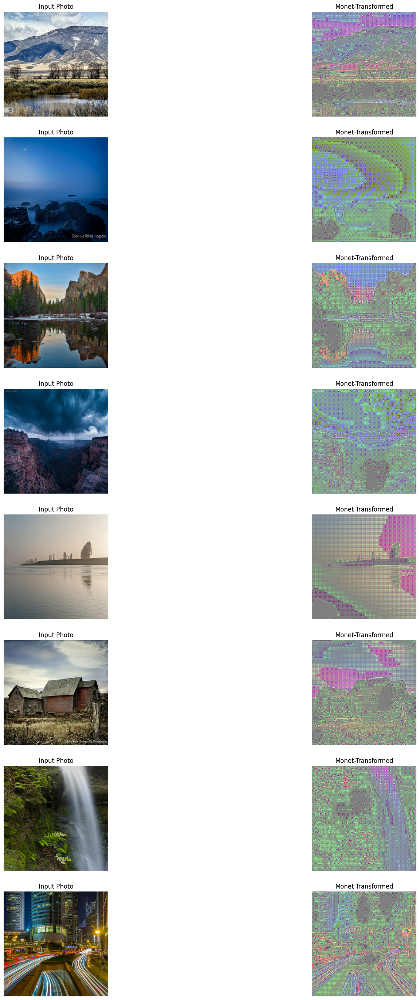

In [39]:
#Lets display some input photos on the left and their monet versions on the right
_, ax = plt.subplots(8, 2 , figsize=(20, 30))
for i, img in enumerate(photo_ds.take(8)):
    prediction = monet_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)
    
    ax[i, 0].axis('off')
    ax[i, 0].imshow(img, aspect='equal')
    ax[i, 1].axis('off')
    ax[i, 1].imshow(prediction, aspect='equal')
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-Transformed")
    
plt.show()

## Third Architecture
In an attempt to fix the ReLU problem, I will use leakyReLU which should cause some amount of training even without a strong activation, which I believe may have caused the issues in the second generative model. Additionally, we don't see much improvement in the later epochs, so in an attempt to avoid overfitting to our dataset, the epoch count will be reduced to 15. This will have the secondary benefit of reducing computation times.

In [20]:
def Generator():
    inputs = layers.Input(shape=[256, 256, 3])
    
    #all our downsampling layers
    down_stack = [
        downsample(64, 4, apply_instancenorm=False),
        downsample(128, 4),
        downsample(256, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
        downsample(512, 4),
    ]
    
    #upsampling layers
    up_stack = [
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4, apply_dropout=True),
        upsample(512, 4),
        upsample(256, 4),
        upsample(128, 4),
        upsample(64, 4),
    ]
    
    initializer = tf.random_normal_initializer(0, 0.02)
    last = layers.Conv2DTranspose(3, 4, strides=2, padding='same', kernel_initializer=initializer)
    
    x = inputs
    
    #Downsampling
    
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    #we use the output from the final downsample layer to create the first upsample layer but we don't retain it itself for concatenation. This is because we need to concatenate to make
    #our skip connections work from first downsample layer to last upsample layer etc. But there's no equivalent size upsample for the final downsample layer to concatenate to, or connect to, as it
    #is the furthest point from the original image
    #we reverse so that they concatenate to the upsampling layers of the same sizes
    skips = reversed(skips[:-1])
    
    #upsampling and skip-connecting
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])


    x = last(x)
    x = layers.LeakyReLU()(x) #had to move the activation layer here
    
    return keras.Model(inputs=inputs, outputs=x)

In [21]:
with strategy.scope():
    monet_generator = Generator()
    photo_generator = Generator()
    
    monet_discriminator = Discriminator()
    photo_discriminator = Discriminator()

In [22]:
#Here we set our optimizer functions. small learning rates with 50% decay.
with strategy.scope():
    monet_gen_opter = tf.keras.optimizers.Adam(2e-3, beta_1=0.5)
    photo_gen_opter = tf.keras.optimizers.Adam(2e-3, beta_1=0.5)
    
    monet_disc_opter = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_disc_opter = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [23]:
#Here we intantiate and compile our GAN, giving it our functions we've defined for losses and models.
with strategy.scope():
    cycle_gan_model = CycleGan(
        monet_generator, photo_generator, monet_discriminator, photo_discriminator
    )
    
    cycle_gan_model.compile(
        m_gen_opter = monet_gen_opter,
        p_gen_opter = photo_gen_opter,
        m_disc_opter = monet_disc_opter,
        p_disc_opter = photo_disc_opter,
        gen_loss_fn = generator_loss,
        disc_loss_fn = disc_loss,
        cyc_loss_fn = calc_cyc_loss,
        id_loss_fn = id_loss  
    )

In [24]:
#Finally we fit our GAN on our datasets
cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs = 10
)

Epoch 1/25


2023-04-26 07:12:57.922753: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-04-26 07:12:59.572149: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


300/300 [==============================] - 168s 134ms/step - Monet Generator Loss: 3.9060 - Photo Generator Loss: 3.9256 - Monet Discriminator Loss: 0.6598 - Photo Discriminator Loss: 0.6528
Epoch 2/25
300/300 [==============================] - 40s 132ms/step - Monet Generator Loss: 2.9984 - Photo Generator Loss: 3.0517 - Monet Discriminator Loss: 0.6196 - Photo Discriminator Loss: 0.5973
Epoch 3/25
300/300 [==============================] - 40s 132ms/step - Monet Generator Loss: 2.7948 - Photo Generator Loss: 2.8462 - Monet Discriminator Loss: 0.5976 - Photo Discriminator Loss: 0.5778
Epoch 4/25
300/300 [==============================] - 40s 132ms/step - Monet Generator Loss: 2.7146 - Photo Generator Loss: 2.7628 - Monet Discriminator Loss: 0.5917 - Photo Discriminator Loss: 0.5748
Epoch 5/25
300/300 [==============================] - 40s 132ms/step - Monet Generator Loss: 2.6435 - Photo Generator Loss: 2.7077 - Monet Discriminator Loss: 0.5922 - Photo Discriminator Loss: 0.5711
Epoch

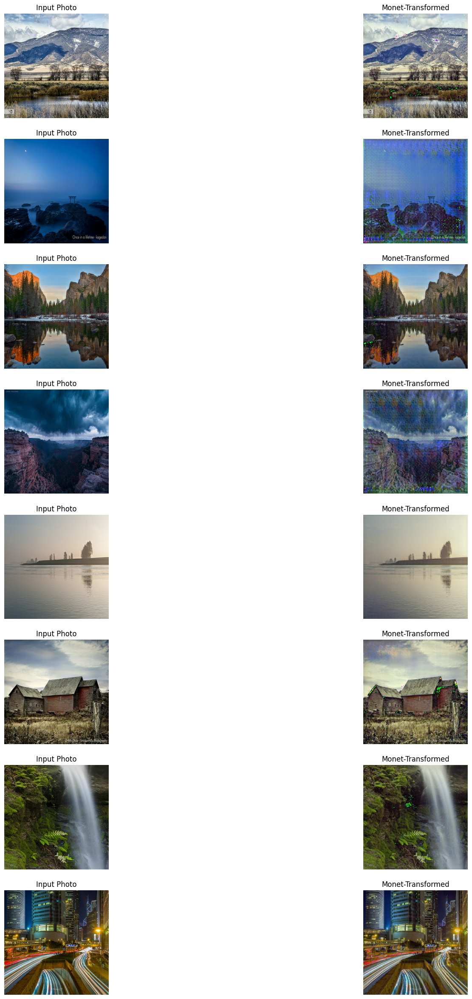

In [25]:
#Lets display some input photos on the left and their monet versions on the right
_, ax = plt.subplots(8, 2 , figsize=(20, 30))
for i, img in enumerate(photo_ds.take(8)):
    prediction = monet_generator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)
    
    ax[i, 0].axis('off')
    ax[i, 0].imshow(img, aspect='equal')
    ax[i, 1].axis('off')
    ax[i, 1].imshow(prediction, aspect='equal')
    ax[i, 0].set_title("Input Photo")
    ax[i, 1].set_title("Monet-Transformed")
    
plt.show()

Interestingly enough, the LeakyReLU architecture has lower loss functions throughout its training, but upon inspection of some of the generated images, there are obvious signs of computer generation, particularly in some very green, very out of place pixels.

## Conclusion
Here we saw three versions of the same GAN with a single layer changed in the generator. With a tanh final function, we saw pretty decent images with good loss function results, and this is the model I will use for submission. When the layer is changed to ReLU we see an absolute lack of generation training in both the loss function results and sample images. What I hope to analyze further is the output of the LeakyReLU generator, which produced the lowest loss function results yet provided images that a human could instantly recognize as machine-made. If there was a way to include a LeakyReLU activation function in the generator and avoid these bright green pixels, we might receive a stronger model overall.